# Cell typing

Read in all necessary packages:

In [4]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.io.parsers import read_csv
import scvelo as scv
import scanpy as sc
import numpy as np
from functools import reduce
from anndata import AnnData, read_h5ad
import singlecellmultiomics.bamProcessing.bamToRNACounts
import loompy
import collections

In [5]:
scv.settings.verbosity = 3 # show errors(0), warnings(1), info(2), hints(3)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scv.settings.presenter_view = True  # set max width size for presenter view
sc.set_figure_params(dpi=80, color_map = 'viridis')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.19.2 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


# Load the dataset

In [3]:
#import loom in adata
adata = sc.read_h5ad('../data/20230619_allGastruloids_UMAP_celltypes.h5ad')
adata

AnnData object with n_obs × n_vars = 38117 × 27384
    obs: 'batch2', 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'cellnames', 'bc', 'cellname', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_counts_stressgenes', 'n_genes', 'S_score', 'G2M_score', 'phase', 'histone_score', 'mark_binary', 'enrichment', 'coverage', 'QC', 'umap_density_mark', 'predicted_id_E75', 'predicted_id_E85', 'prediction_confidence_E75', 'prediction_confidence_E85', 'predicted_final', 'leiden', 'celltype', 'old_leiden_general', 'old_celltype', 'old_leiden_merge', 'umap_1D', 'umap_1D_rescale'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'dataset_colors', 'day_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'mark_colors', 'neighbors', 'old_celltype_colors', 'old_leiden_general_colors', 'old_

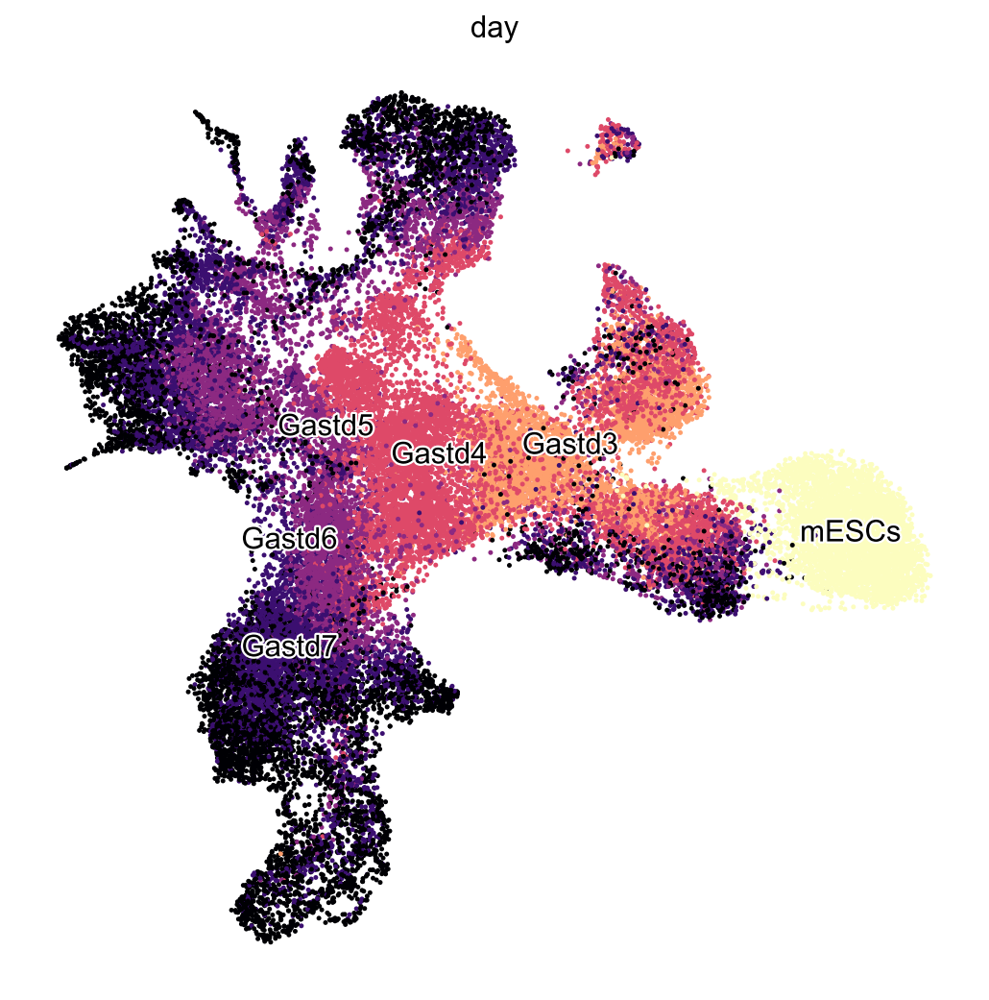

In [6]:
sc.set_figure_params(dpi=80)
fig,ax = plt.subplots(figsize=(8,8))
adata.obs['day'] = adata.obs['day'].cat.reorder_categories(['mESCs','Gastd3','Gastd4','Gastd5','Gastd6','Gastd7'])
sc.pl.umap(adata,color='day',ax=ax,frameon=False, size = 20,legend_loc = 'on data', legend_fontoutline=2,legend_fontweight='light',palette='magma_r',
           #palette = ['#428f42','#a74acf'], #['#008000', '#9400d3']
           alpha=1)

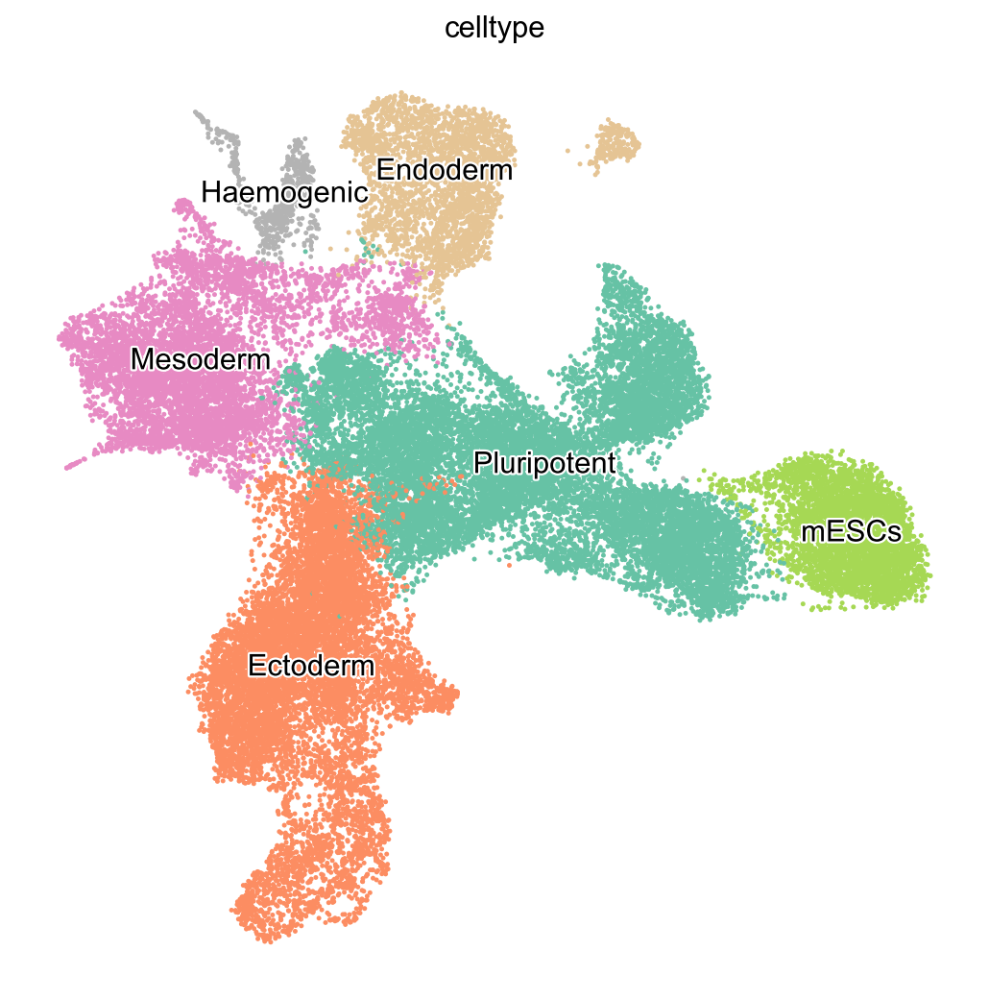

In [7]:
sc.set_figure_params(dpi=80)
fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata,color='celltype',ax=ax,frameon=False, size = 20,legend_loc = 'on data', legend_fontoutline=2,legend_fontweight='light',
           #palette = ['#428f42','#a74acf'], #['#008000', '#9400d3']
           alpha=1)

In [8]:
sns.color_palette('Set2')

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

In [9]:
print(sns.color_palette('Set2').as_hex())

['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3']


running Leiden clustering
    finished: found 31 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


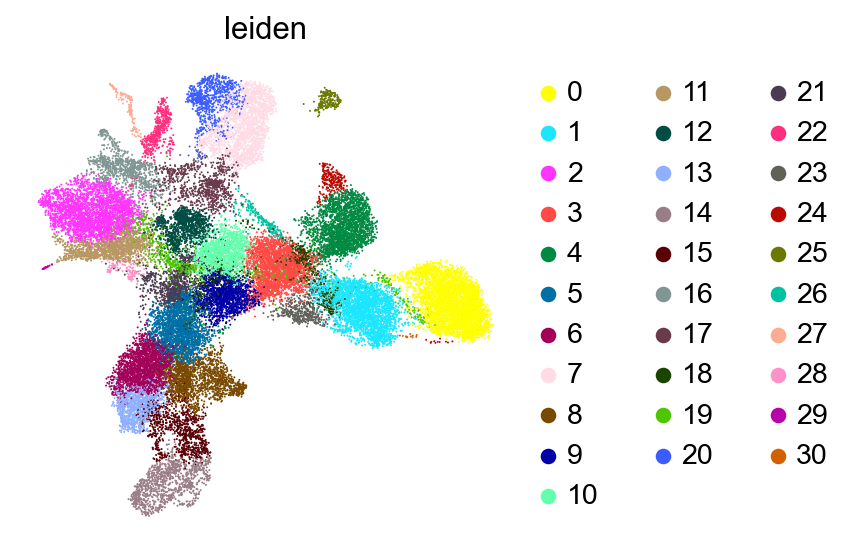

In [11]:
sc.tl.leiden(adata,resolution=1.2)
sc.pl.umap(adata,color='leiden', frameon = False)

# Haemogenic

In [12]:
sc.set_figure_params(dpi=80)

running Leiden clustering
    finished: found 5 clusters and added
    'new', the cluster labels (adata.obs, categorical) (0:00:00)


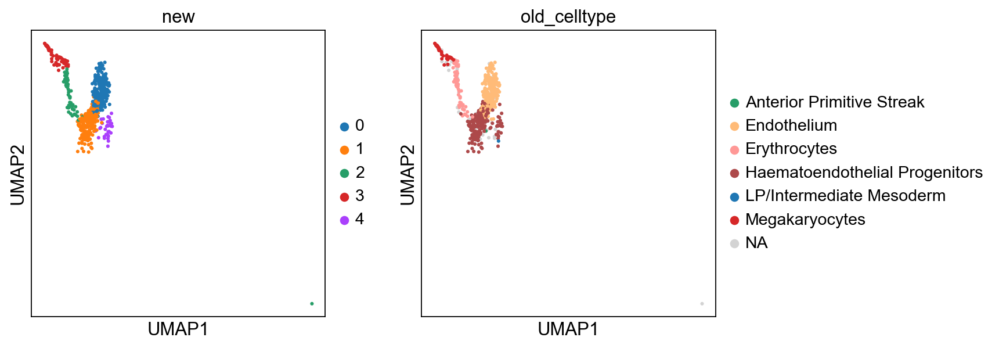

In [13]:
adata_h = adata[adata.obs['celltype'] =='Haemogenic']
sc.tl.leiden(adata_h, resolution = 0.3, key_added = 'new')
sc.pl.umap(adata_h,color = ['new','old_celltype'], size = 30)

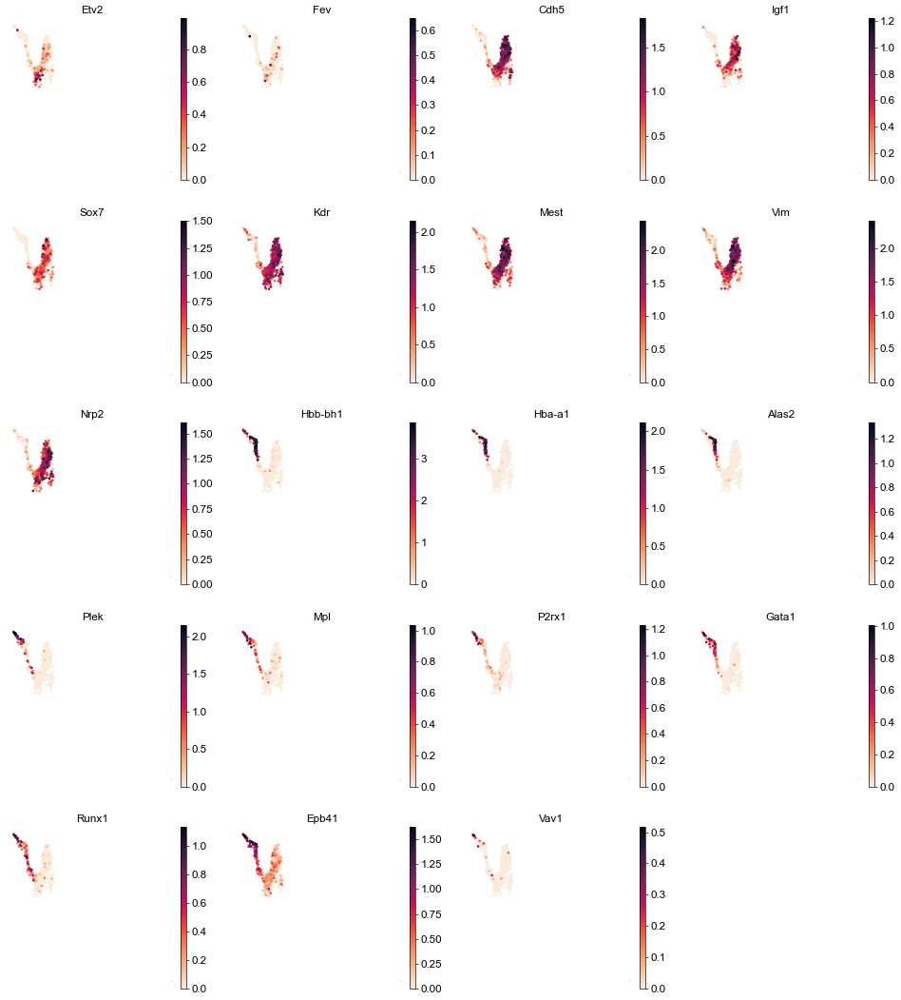

In [59]:
sc.set_figure_params(dpi=30)
genes_h = [    'Etv2','Fev',                            # Hematoendothelial progenitors
    'Cdh5','Igf1','Sox7','Kdr','Mest','Vim','Nrp2',                    # Endothelium
    'Hbb-bh1','Hba-a1','Alas2',              # Erythrocytes
    'Plek','Mpl','P2rx1',                   # Megakaryocytes
           'Gata1','Runx1','Epb41', 'Vav1']                                     # HSCs Erys               

sc.pl.umap(adata_h, color = genes_h, ncols = 4, frameon=False, size = 40, cmap = 'rocket_r')

In [15]:
adata_h.rename_categories('new', ['Endothelium','1','Erythrocytes','Megakaryocytes','4'])


adata_h.obs['new'] = [sub.replace('1', 'Endothelium') for sub in adata_h.obs['new']]
adata_h.obs['new'] = [sub.replace('4', 'Endothelium') for sub in adata_h.obs['new']]

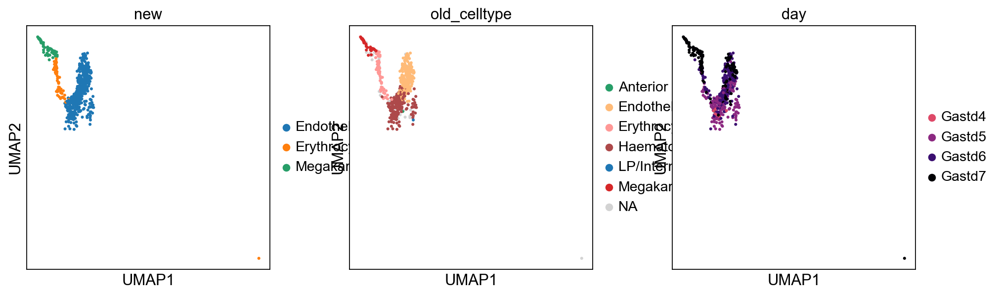

In [16]:
sc.pl.umap(adata_h,color = ['new','old_celltype','day'], size = 30)

# Endoderm

running Leiden clustering
    finished: found 5 clusters and added
    'new', the cluster labels (adata.obs, categorical) (0:00:02)


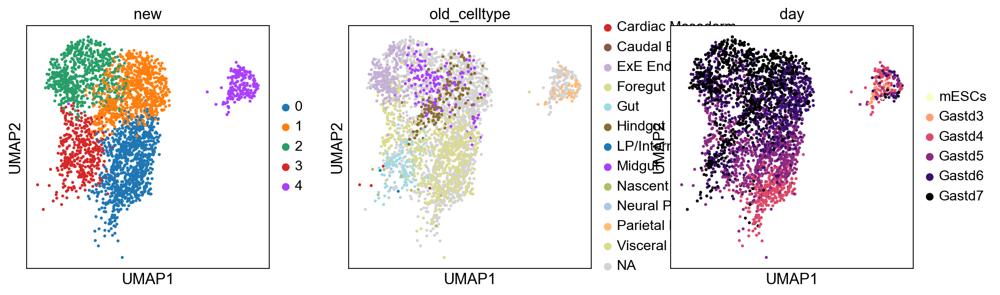

In [18]:
adata_e = adata[adata.obs['celltype'] =='Endoderm']
sc.tl.leiden(adata_e, resolution = 0.2, key_added = 'new')
sc.pl.umap(adata_e,color = ['new','old_celltype','day'], size = 30)


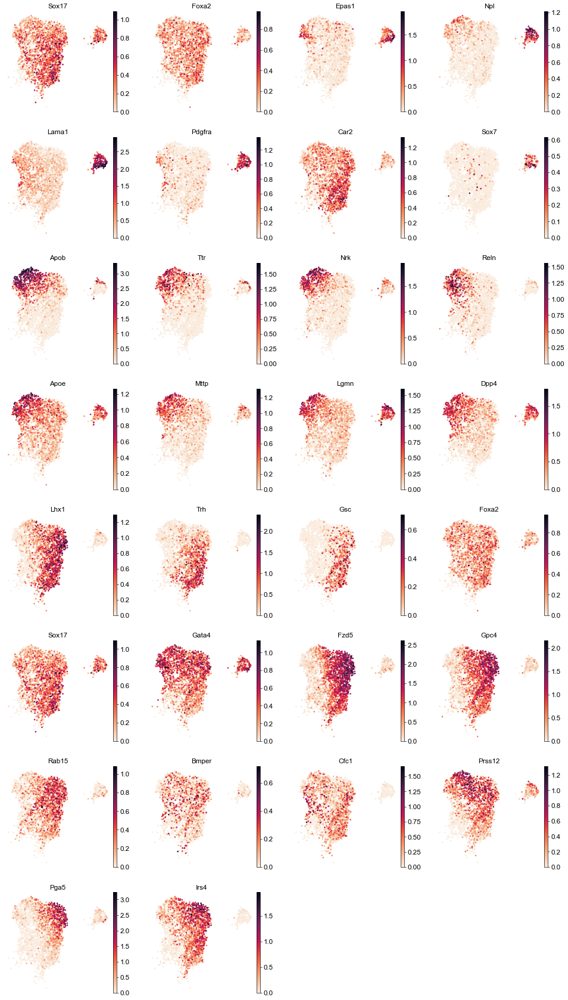

In [60]:
genes_e = ['Sox17','Foxa2',                         # Endoderm
    'Epas1','Npl','Lama1','Pdgfra','Car2','Sox7',                           # Parietal endoderm
    'Apob','Ttr', 'Nrk','Reln','Apoe','Mttp','Lgmn','Dpp4',                                # ExE Endoderm
    'Lhx1','Trh','Gsc','Foxa2','Sox17','Gata4', 'Fzd5', 'Gpc4',                          # Visceral endoderm
    'Rab15',                                 # Gut
    'Bmper','Cfc1',                          # Foregut
    'Prss12','Pga5',                         # Midgut
    'Irs4']                                  # Hindgut
    
    
          
sc.pl.umap(adata_e, color = genes_e, ncols = 4, frameon=False, size = 40, cmap = 'rocket_r')

In [20]:
adata_e.rename_categories('new', ['Visceral Endoderm','1','ExE Endoderm','e_3','Parietal Endoderm'])
adata_e.obs['new'] = [sub.replace('1', 'Visceral Endoderm') for sub in adata_e.obs['new']]



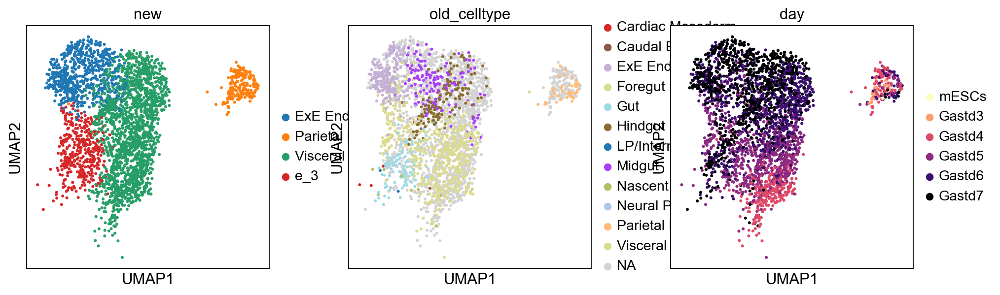

In [21]:
sc.pl.umap(adata_e,color = ['new','old_celltype','day'], size = 30)


# Ectoderm

running Leiden clustering
    finished: found 11 clusters and added
    'new', the cluster labels (adata.obs, categorical) (0:00:09)


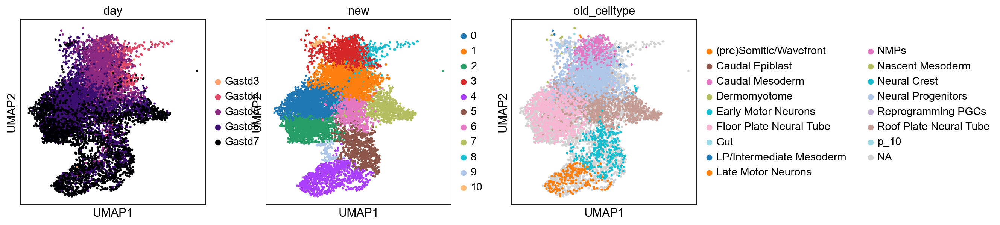

In [23]:
sc.set_figure_params(dpi=80)
adata_n = adata[adata.obs['celltype'] =='Ectoderm']
sc.tl.leiden(adata_n, resolution = 0.4, key_added = 'new')
sc.pl.umap(adata_n,color = ['day','new','old_celltype'], size = 30)#, legend_loc = 'on data',legend_fontweight = 'light',legend_fontoutline=2,legend_fontsize=8)


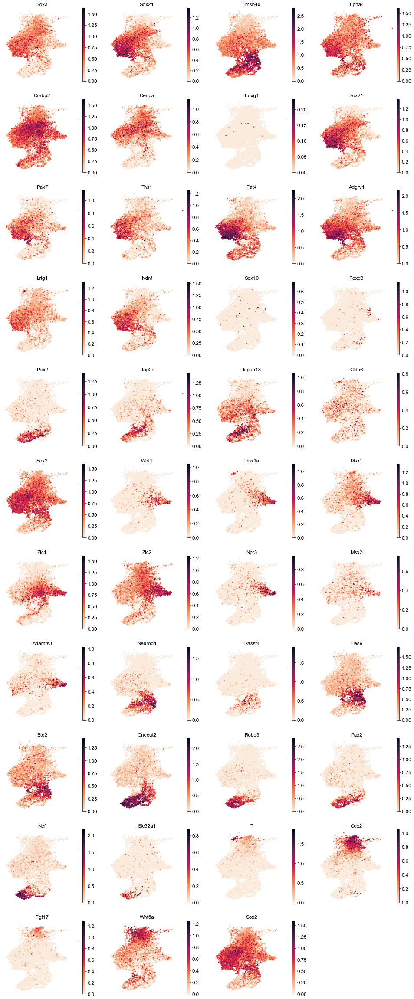

In [61]:
genes_n = [                               
    'Sox3','Sox21','Tmsb4x','Epha4','Crabp2','Cenpa','Foxg1',                                  # Neural progenitors
    'Sox21','Pax7', 'Tns1','Fat4','Adgrv1','Lrig1','Ndnf',                                 # Floor plate NT
    'Sox10','Foxd3','Pax2', 'Tfap2a','Tspan18','Cldn6',                         # Neural crest
    'Sox2',     #Neural                    
    'Wnt1','Lmx1a','Msx1','Zic1','Zic2','Npr3','Msx2','Adamts3',            # Roof plate NT
    'Neurod4','Rassf4','Hes6', 'Btg2',                      # Early MN
    'Onecut2','Robo3','Pax2','Nefl','Slc32a1' ,                 # Late MN
    'T','Cdx2','Fgf17', 'Wnt5a','Sox2']                     # NMP            

sc.pl.umap(adata_n, color = genes_n, ncols = 4, frameon=False, size = 40, cmap = 'rocket_r')

In [25]:
adata_n.rename_categories('new', ['Floor Plate Neural Tube','Neural Progenitors','2','NMPs','Late Motor Neurons','Early Motor Neurons', 'Roof Plate Neural Tube','7','n_8','9','10'])


adata_n.obs['new'] = [sub.replace('2', 'Floor Plate Neural Tube') for sub in adata_n.obs['new']]
adata_n.obs['new'] = [sub.replace('7', 'Roof Plate Neural Tube') for sub in adata_n.obs['new']]
adata_n.obs['new'] = [sub.replace('9', 'Early Motor Neurons') for sub in adata_n.obs['new']]
adata_n.obs['new'] = [sub.replace('10', 'NMPs') for sub in adata_n.obs['new']]

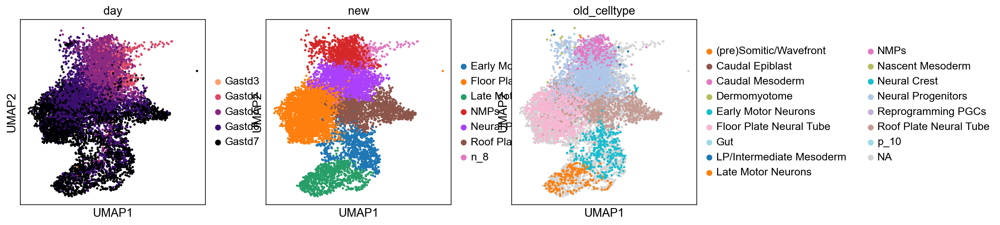

In [26]:
sc.pl.umap(adata_n,color = ['day','new','old_celltype'], size = 30)


# Mesoderm

running Leiden clustering
    finished: found 17 clusters and added
    'new', the cluster labels (adata.obs, categorical) (0:00:10)


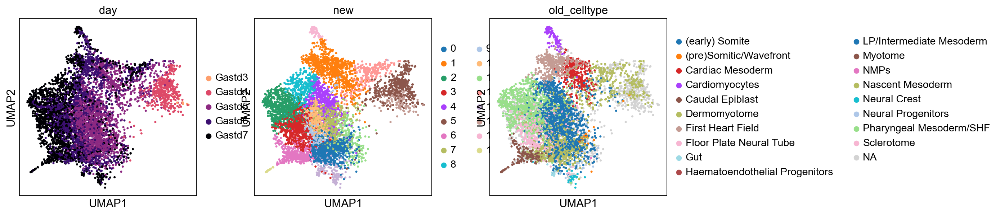

In [29]:
sc.set_figure_params(dpi=80)
adata_m = adata[adata.obs['celltype'] =='Mesoderm']
sc.tl.leiden(adata_m, resolution = 0.8, key_added = 'new')
sc.pl.umap(adata_m,color = ['day','new','old_celltype'], size = 30)#, legend_loc = 'on data',legend_fontweight = 'light',legend_fontoutline=2,legend_fontsize=8)


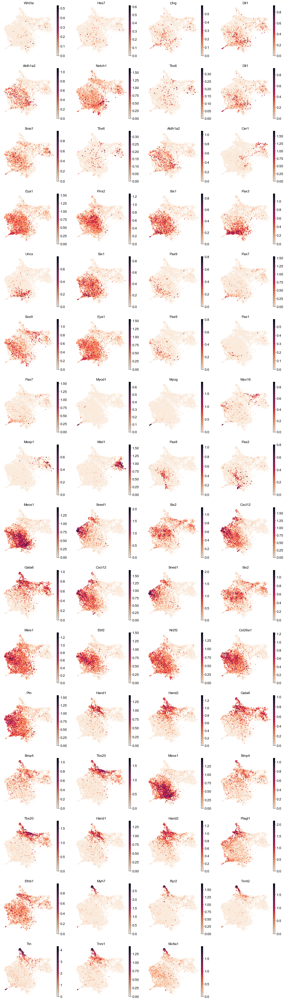

In [62]:
genes_m = [   'Wnt3a',                                 # Caudal mesoderm
    'Hes7','Lfng','Dll1','Aldh1a2', 'Notch1', 'Tbx6','Dll1','Snai1','Tbx6','Aldh1a2','Cer1',         # Presomitic/Wavefront                - 
    'Eya1','Prrx2', 'Six1' ,                        # (early) somite
    'Pax3','Uncx','Six1', 'Pax9','Pax7','Sox9','Eya1',                          # Dermomyotome
    'Pax9','Pax1',                           # Sclerotome
    'Pax7','Myod1','Myog', 'Myo16',                  # Myotome
    'Mesp1','Mixl1',                        # Nascent mesoderm 
    'Pax8','Pax2',                           # LP/Intermediate mesoderm
    'Meox1','Sned1','Six2','Cxcl12','Gata6', # Pharyngeal mesoderm
    'Cxcl12','Sned1','Six2','Meis1','Ebf2','Nr2f2','Col26a1','Ptn' ,                                      # SHF  
    'Hand1','Hand2', 'Gata6','Bmp4','Tbx20', 'Meox1',                        # Cardiac mesoderm
    'Bmp4','Tbx20','Hand1','Hand2', 'Plagl1','Efnb1',                              # First Heart Field
    'Myh7','Ryr2','Tnnt2', 'Ttn','Tnni1','Slc8a1']                  # Cardiomyocytes                    
        

sc.pl.umap(adata_m, color = genes_m, ncols = 4, frameon=False, size = 40, cmap = 'rocket_r')

In [32]:
adata_m.rename_categories('new', ['Dermomyotome','Cardiac Mesoderm','Pharyngeal Mesoderm','Sclerotome','(early) Somite','Nascent Mesoderm','6','LP/Intermediate Mesoderm','8','9','10','11',
                                 '12','13','14','Cardiomyocytes','Myotome'])
adata_m.obs['new'] = [sub.replace('6', 'Dermomyotome') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('8', 'Pharyngeal Mesoderm') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('9', 'LP/Intermediate Mesoderm') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('10', 'LP/Intermediate Mesoderm') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('11', 'LP/Intermediate Mesoderm') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('12', 'Nascent Mesoderm') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('13', 'Dermomyotome') for sub in adata_m.obs['new']]
adata_m.obs['new'] = [sub.replace('14', 'Nascent Mesoderm') for sub in adata_m.obs['new']]


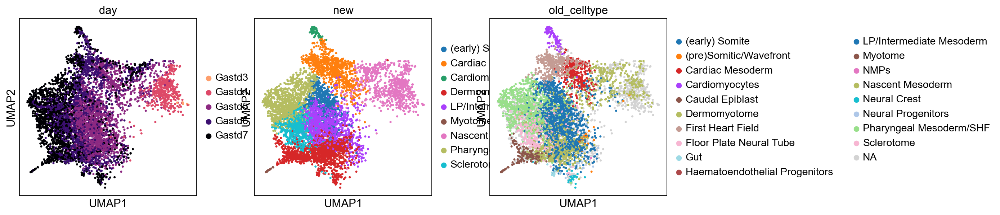

In [33]:
sc.pl.umap(adata_m,color = ['day','new','old_celltype'], size = 30)


# pluripotent

running Leiden clustering
    finished: found 17 clusters and added
    'new', the cluster labels (adata.obs, categorical) (0:00:25)


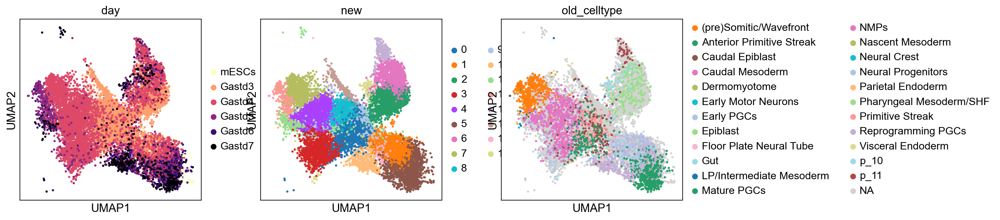

In [35]:
sc.set_figure_params(dpi=80)
adata_p = adata[adata.obs['celltype'] =='Pluripotent']
sc.tl.leiden(adata_p, resolution = 0.9, key_added = 'new')
sc.pl.umap(adata_p,color = ['day','new','old_celltype'], size = 30)#, legend_loc = 'on data',legend_fontweight = 'light',legend_fontoutline=2,legend_fontsize=8)


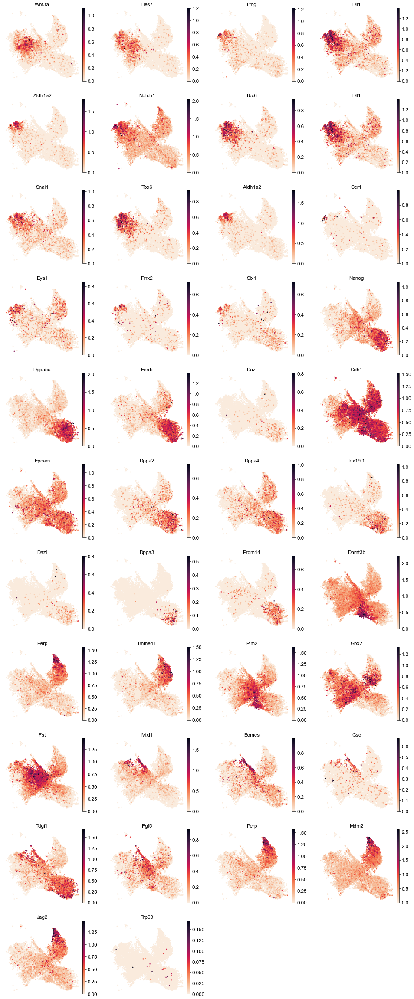

In [63]:
genes_p =  [   'Wnt3a',                                 # Caudal mesoderm
    'Hes7','Lfng','Dll1','Aldh1a2', 'Notch1', 'Tbx6','Dll1','Snai1','Tbx6','Aldh1a2','Cer1',         # Presomitic/Wavefront                - 
    'Eya1','Prrx2', 'Six1' ,                        # (early) somite
    'Nanog','Dppa5a','Esrrb','Dazl','Cdh1','Epcam','Dppa2','Dppa4'  ,              # PGCs
    'Tex19.1','Dazl','Dppa3','Prdm14',       # Mature PGCs
    'Dnmt3b',                                # Reprogramming PGCs
    'Perp','Bhlhe41',                        # Epiblast
    'Pim2','Gbx2','Fst',                     # Caudal epiblast
    'Mixl1','Eomes','Gsc','Tdgf1','Fgf5',    # Primitive streak
    'Perp', 'Mdm2', 'Jag2','Trp63' ]          #epidermis prog
    
    
    
   
sc.pl.umap(adata_p, color = genes_p, ncols = 4, frameon=False, size = 40, cmap = 'rocket_r')

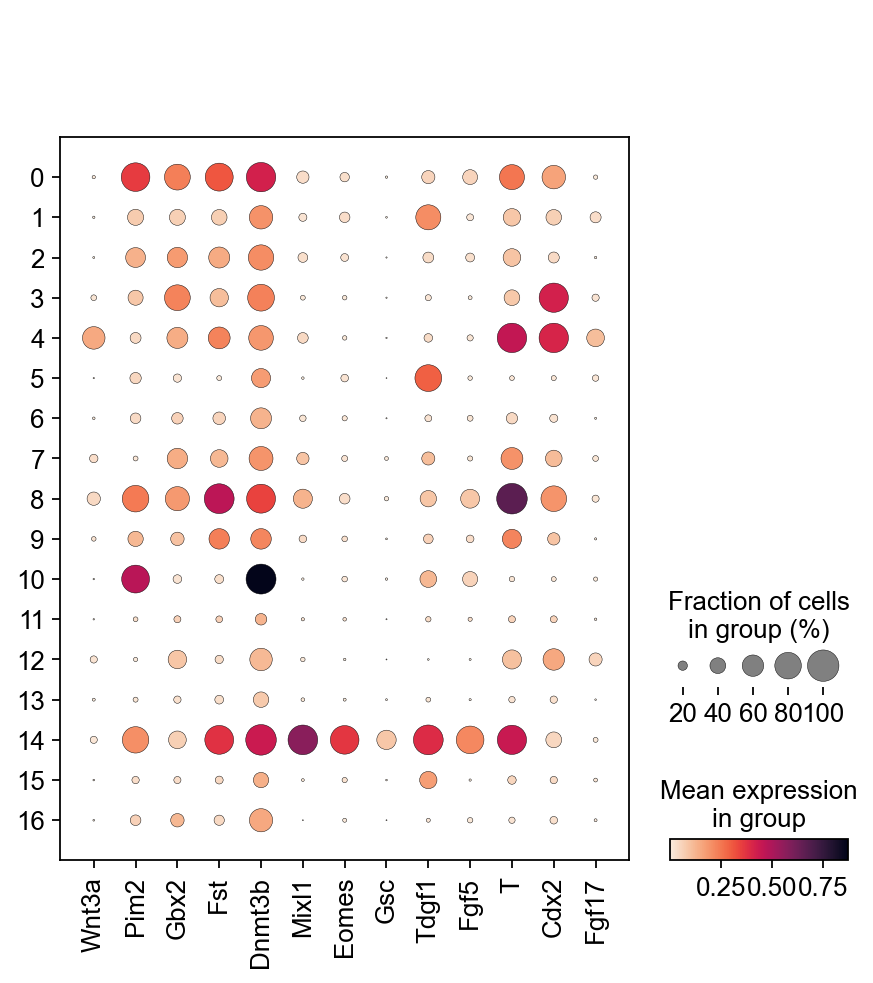

In [38]:
genes_p =  [   'Wnt3a',                                 # Caudal mesoderm
        'Pim2','Gbx2','Fst', 'Dnmt3b',                    # Caudal epiblast
    'Mixl1','Eomes','Gsc','Tdgf1','Fgf5',    # Primitive streak
            'T','Cdx2','Fgf17']
    
    
    
   
sc.pl.dotplot(adata_p, var_names = genes_p, groupby='new', cmap = 'rocket_r')

In [42]:
adata_p.rename_categories('new', ['Caudal Epiblast','Naive PGCs','Epiblast','Caudal Mesoderm',
                                  '4','PGCs','6','(pre)Somitic/Wavefront','8','9',
                                  'Reprogramming PGCs','11','12','Epidermis Progenitors',
                                  'Primitive Streak','x','16'])

adata_p.obs['new'] = [sub.replace('x', 'Naive PGCs') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('16', 'Epiblast') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('4', 'Caudal Mesoderm') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('6', 'Epiblast') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('8', 'Caudal Epiblast') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('9', 'Caudal Epiblast') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('11', 'Caudal Mesoderm') for sub in adata_p.obs['new']]
adata_p.obs['new'] = [sub.replace('12', '(pre)Somitic/Wavefront') for sub in adata_p.obs['new']]

                                
                                                      
                                  

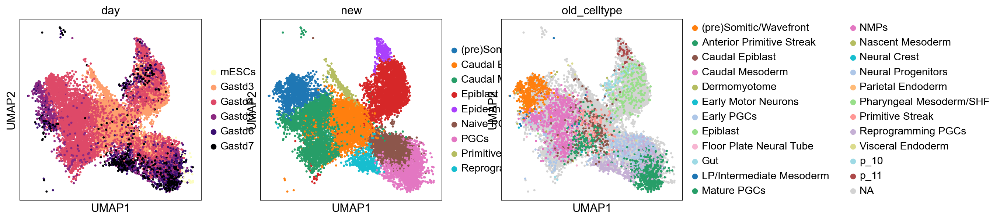

In [43]:
sc.pl.umap(adata_p,color = ['day','new','old_celltype'], size = 30)


# merge all

In [50]:
#adata.obs['lineage'] = adata.obs['celltype']
#All celltypes
new_clusters = pd.concat([adata_p.obs['new'],adata_m.obs['new'],adata_n.obs['new'],
                          adata_e.obs['new'],adata_h.obs['new'],adata_esc.obs['new']])

adata.obs['celltype'] = new_clusters
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

adata.obs['celltype'] = [sub.replace('(pre)Somitic/Wavefront', 'preSomitic/Wavefront') for sub in adata.obs['celltype']]
adata.obs['celltype'] = [sub.replace('(early) Somite', 'Somite') for sub in adata.obs['celltype']]
adata.obs['celltype'] = [sub.replace('e_3', 'Visceral Endoderm') for sub in adata.obs['celltype']]
adata.obs['celltype'] = [sub.replace('n_8', 'Caudal Mesoderm') for sub in adata.obs['celltype']]

adata.obs['celltype']=adata.obs['celltype'].astype('category')

adata.obs['celltype'] = adata.obs['celltype'].cat.reorder_categories([ 'mESCs','Primitive Streak','Caudal Epiblast', 'Epiblast', 'Naive PGCs', 'Epidermis Progenitors',
                                                                      'Caudal Mesoderm','Parietal Endoderm','PGCs','preSomitic/Wavefront','Nascent Mesoderm',
                                                                     'NMPs','LP/Intermediate Mesoderm','Neural Progenitors','Somite','Cardiac Mesoderm',
                                                                      'Endothelium','Visceral Endoderm','Dermomyotome','Erythrocytes','Reprogramming PGCs',
                                                                      'Sclerotome','Roof Plate Neural Tube', 'Floor Plate Neural Tube', 'ExE Endoderm',  
                                                                      'Cardiomyocytes','Pharyngeal Mesoderm', 'Early Motor Neurons','Late Motor Neurons',
                                                                      'Myotome', 'Megakaryocytes'])

cols = [ 'teal','mediumseagreen','forestgreen', # 'mESCs','Primitive Streak','Caudal Epiblast', 
        'palegreen',  'yellowgreen', #'Epiblast', 'Naive PGCs',
        'lightseagreen', 'hotpink', #'Epidermis Progenitors', 'Caudal Mesoderm',
        'chocolate','gold', # 'Parietal Endoderm','PGCs'
        'tomato','thistle',           # ,'preSomitic/Wavefront','Nascent Mesoderm',                                    
        'royalblue','blueviolet', # 'NMPs','LP/Intermediate Mesoderm'
        'cyan','mistyrose', #,'Neural Progenitors','Somite',
        'crimson','slategrey', #'Cardiac Mesoderm', 'Endothelium',
        'darkorange','indianred', #'Visceral Endoderm','Dermomyotome'
        'lightsteelblue', 'greenyellow', #,'Erythrocytes','Reprogramming PGCs',                                                         
        'plum','deepskyblue', # 'Sclerotome','Roof Plate Neural Tube',
        'navy', 'saddlebrown', # 'Floor Plate Neural Tube', 'ExE Endoderm',
        'indigo','darkred', # 'Cardiomyocytes','Pharyngeal Mesoderm',
        'dodgerblue','powderblue', #'Early Motor Neurons','Late Motor Neurons',
        'maroon', 'darkslategray'] # 'Myotome', 'Megakaryocytes'




In [51]:
adata.obs['celltype_general'] = adata.obs['celltype']
adata.obs['celltype_general'] = adata.obs['celltype_general'].astype('category')

#endoderm
adata.obs['celltype_general'] = [sub.replace('Visceral Endoderm', 'Endoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('ExE Endoderm', 'Endoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Parietal Endoderm', 'Endoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Visceral Endoderm', 'Endoderm') for sub in adata.obs['celltype_general']]

#Neural
adata.obs['celltype_general'] = [sub.replace('Floor Plate Neural Tube', 'Neural Tube') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Early Motor Neurons', 'Motor Neurons') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Roof Plate Neural Tube', 'Neural Tube') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Late Motor Neurons', 'Motor Neurons') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Caudal Mesoderm', 'NMPs') for sub in adata.obs['celltype_general']]

#Haemogenic
adata.obs['celltype_general'] = [sub.replace('Endothelium', 'Haemogenic') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Erythrocytes', 'Haemogenic') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Megakaryocytes', 'Haemogenic') for sub in adata.obs['celltype_general']]

#Mesoderm
adata.obs['celltype_general'] = [sub.replace('LP/Intermediate Mesoderm', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Dermomyotome', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Pharyngeal Mesoderm', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Somite', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Nascent Mesoderm', 'Cardiac Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Sclerotome', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('LP/Intermediate Mesoderm', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Myotome', 'Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Cardiomyocytes', 'Cardiac Mesoderm') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('LP/Intermediate Mesoderm', 'Mesoderm') for sub in adata.obs['celltype_general']]

#Pluripotency
adata.obs['celltype_general'] = [sub.replace('Naive PGCs', 'PGCs') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Mature PGCs', 'PGCs') for sub in adata.obs['celltype_general']]
adata.obs['celltype_general'] = [sub.replace('Reprogramming PGCs', 'PGCs') for sub in adata.obs['celltype_general']]


adata.obs['celltype_general']=adata.obs['celltype_general'].astype('category')
adata.obs['celltype_general'] = adata.obs['celltype_general'].cat.reorder_categories(['mESCs','Primitive Streak','Caudal Epiblast','Epiblast','Epidermis Progenitors',
                                                                                      'preSomitic/Wavefront','PGCs','Mesoderm',
                                                                                      'Neural Progenitors','NMPs','Endoderm','Cardiac Mesoderm',
                                                                                      'Haemogenic','Neural Tube','Motor Neurons'])

In [52]:
adata.obs['lineage'] = adata.obs['celltype']
adata.obs['lineage'] = adata.obs['lineage'].astype('category')

#endoderm
adata.obs['lineage'] = [sub.replace('Visceral Endoderm', 'Endoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('ExE Endoderm', 'Endoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Parietal Endoderm', 'Endoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Visceral Endoderm', 'Endoderm') for sub in adata.obs['lineage']]

#Neural
adata.obs['lineage'] = [sub.replace('Floor Plate Neural Tube', 'Ectoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Early Motor Neurons', 'Ectoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Roof Plate Neural Tube', 'Ectoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Late Motor Neurons', 'Ectoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('NMPs', 'Ectoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Neural Progenitors', 'Ectoderm') for sub in adata.obs['lineage']]


#Haemogenic
adata.obs['lineage'] = [sub.replace('Endothelium', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Erythrocytes', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Megakaryocytes', 'Mesoderm') for sub in adata.obs['lineage']]

#Mesoderm
adata.obs['lineage'] = [sub.replace('LP/Intermediate Mesoderm', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Dermomyotome', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Pharyngeal Mesoderm', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Somite', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Nascent Mesoderm', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Sclerotome', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('LP/Intermediate Mesoderm', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Myotome', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Cardiomyocytes', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('LP/Intermediate Mesoderm', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('preSomitic/Wavefront', 'Mesoderm') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Cardiac Mesoderm', 'Mesoderm') for sub in adata.obs['lineage']]


#Pluripotency
adata.obs['lineage'] = [sub.replace('Naive PGCs', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Reprogramming PGCs', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('PGCs', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Caudal Mesoderm', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Caudal Epiblast', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('mESCs', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Epiblast', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Epidermis Progenitors', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['lineage'] = [sub.replace('Primitive Streak', 'Pluripotent') for sub in adata.obs['lineage']]

adata.obs['lineage']=adata.obs['lineage'].astype('category')
adata.obs['lineage'] = adata.obs['lineage'].cat.reorder_categories(['Ectoderm','Endoderm','Mesoderm','Pluripotent'])



In [53]:
adata.obs['day'] = adata.obs['day'].cat.reorder_categories(['mESCs','Gastd3','Gastd4','Gastd5','Gastd6','Gastd7'])
adata.obs['hour'] = adata.obs['day']
adata.rename_categories('hour', ['mESCs','72h','96h','120h','144h','168h'])
adata.obs['hour'] = adata.obs['hour'].cat.reorder_categories(['mESCs','72h','96h','120h','144h','168h'])

In [54]:
adata.obs['lineage'] = [sub.replace('mESCs', 'Pluripotent') for sub in adata.obs['lineage']]
adata.obs['day'] = adata.obs['day'].cat.reorder_categories(['mESCs','Gastd3','Gastd4','Gastd5','Gastd6','Gastd7'])
adata.obs['lin_day'] = adata.obs['lineage'].astype(str) + ' ' +adata.obs['day'].astype(str)
adata.obs['lin_day'] = adata.obs['lin_day'].astype('category')

order = ['Ectoderm Gastd3', 'Ectoderm Gastd4', 'Ectoderm Gastd5', 'Ectoderm Gastd6', 'Ectoderm Gastd7',
         'Endoderm mESCs', 'Endoderm Gastd3', 'Endoderm Gastd4', 'Endoderm Gastd5', 'Endoderm Gastd6', 'Endoderm Gastd7',
         'Mesoderm Gastd3', 'Mesoderm Gastd4', 'Mesoderm Gastd5', 'Mesoderm Gastd6', 'Mesoderm Gastd7',
         'Pluripotent mESCs', 'Pluripotent Gastd3', 'Pluripotent Gastd4', 'Pluripotent Gastd5', 'Pluripotent Gastd6',  'Pluripotent Gastd7']

adata.obs['lin_day'] = adata.obs['lin_day'].cat.reorder_categories(order)

In [55]:
cols2 = sns.color_palette("pastel")+sns.color_palette("Set2_r") #+ sns.color_palette("Set3")+sns.color_palette("tab10")+sns.color_palette("pastel")# + sns.color_palette("gnuplot_r")


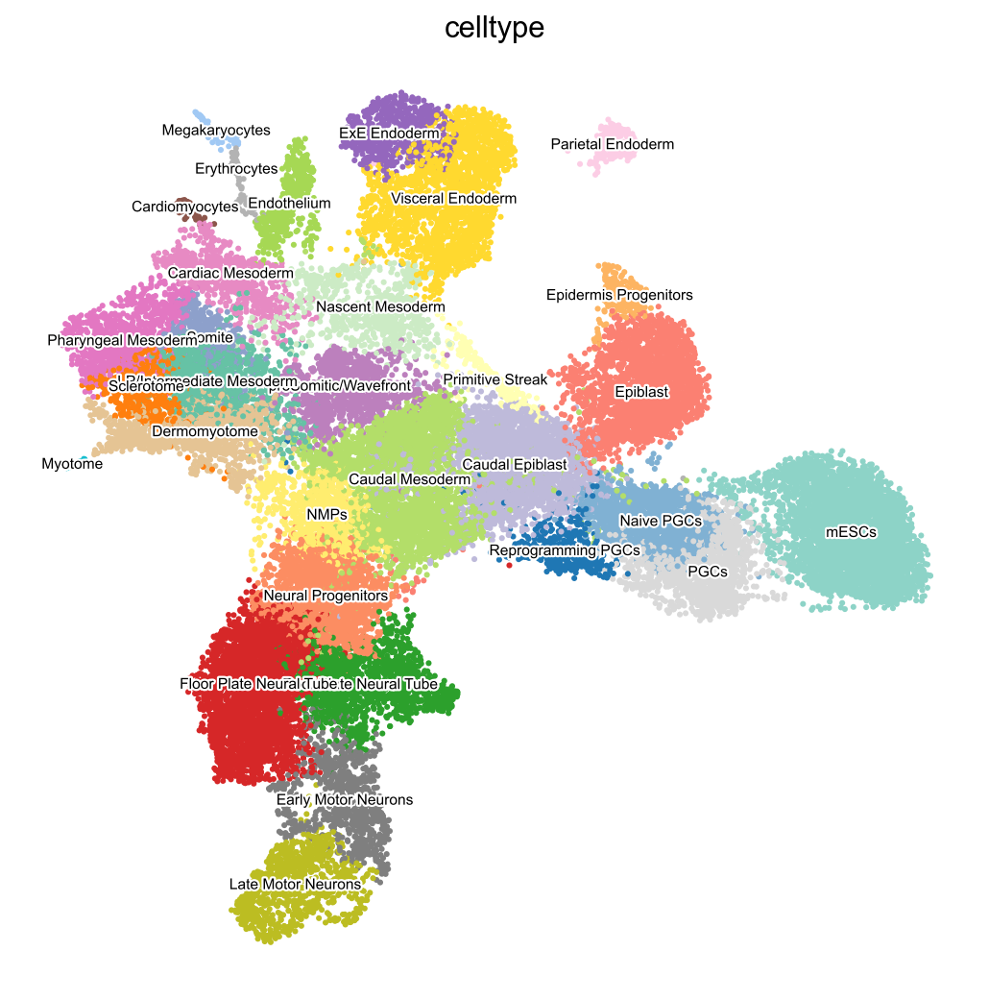

In [56]:
cols = sns.color_palette("Set3")+sns.color_palette("Set2") + sns.color_palette("tab10")+sns.color_palette("pastel")#+sns.color_palette("pastel")# + sns.color_palette("gnuplot_r")
sc.set_figure_params(dpi=80)
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata, color='celltype',ax=ax, palette=cols, #sns.color_palette("hls", len(adata.obs['leiden'].unique())),
           frameon=False, legend_loc = "on data", legend_fontweight="normal", legend_fontsize=7,
           legend_fontoutline=2, size=30, alpha=1)

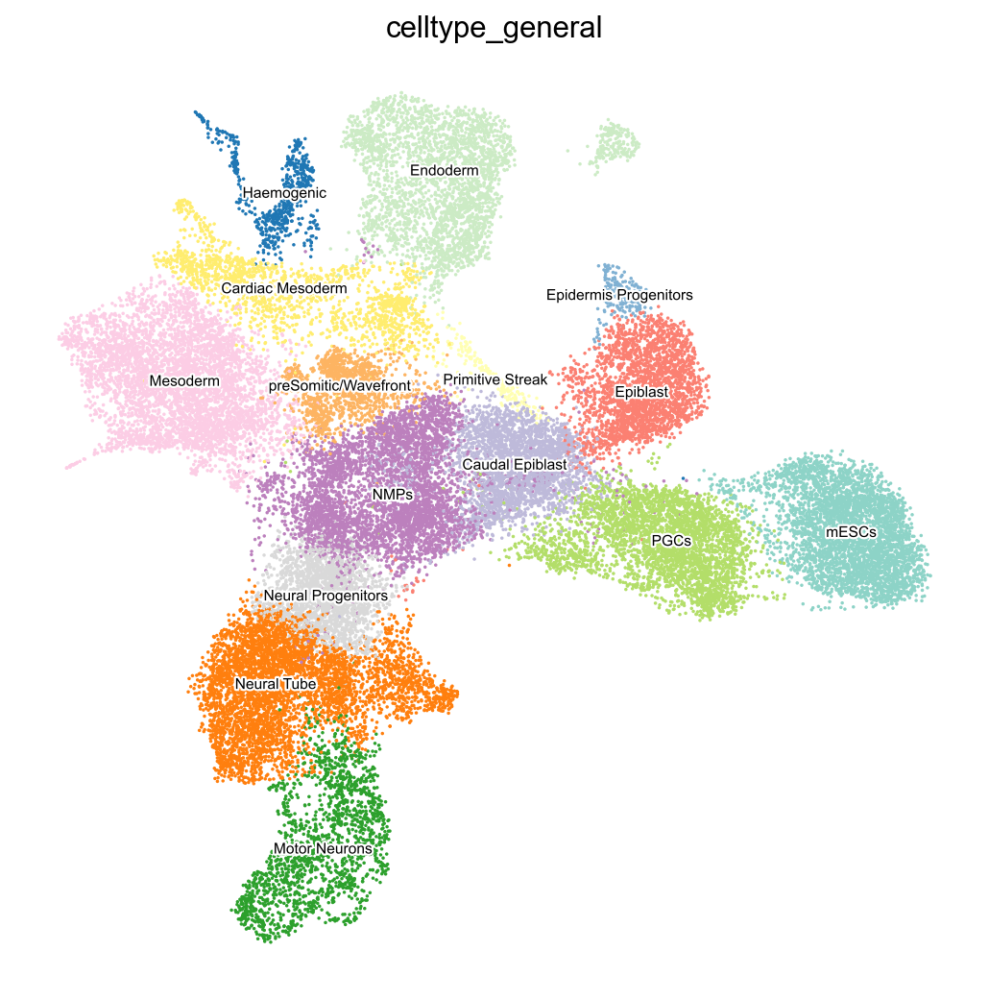

In [57]:
cols = sns.color_palette("Set3")+sns.color_palette("tab10") + sns.color_palette("Set2")+sns.color_palette("pastel")#+sns.color_palette("pastel")# + sns.color_palette("gnuplot_r")
sc.set_figure_params(dpi=80)
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata, color='celltype_general',ax=ax, palette=cols, #sns.color_palette("hls", len(adata.obs['leiden'].unique())),
           frameon=False, legend_loc = "on data", legend_fontweight="normal", legend_fontsize=7,
           legend_fontoutline=2, size=10, alpha=1)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_celltype']`


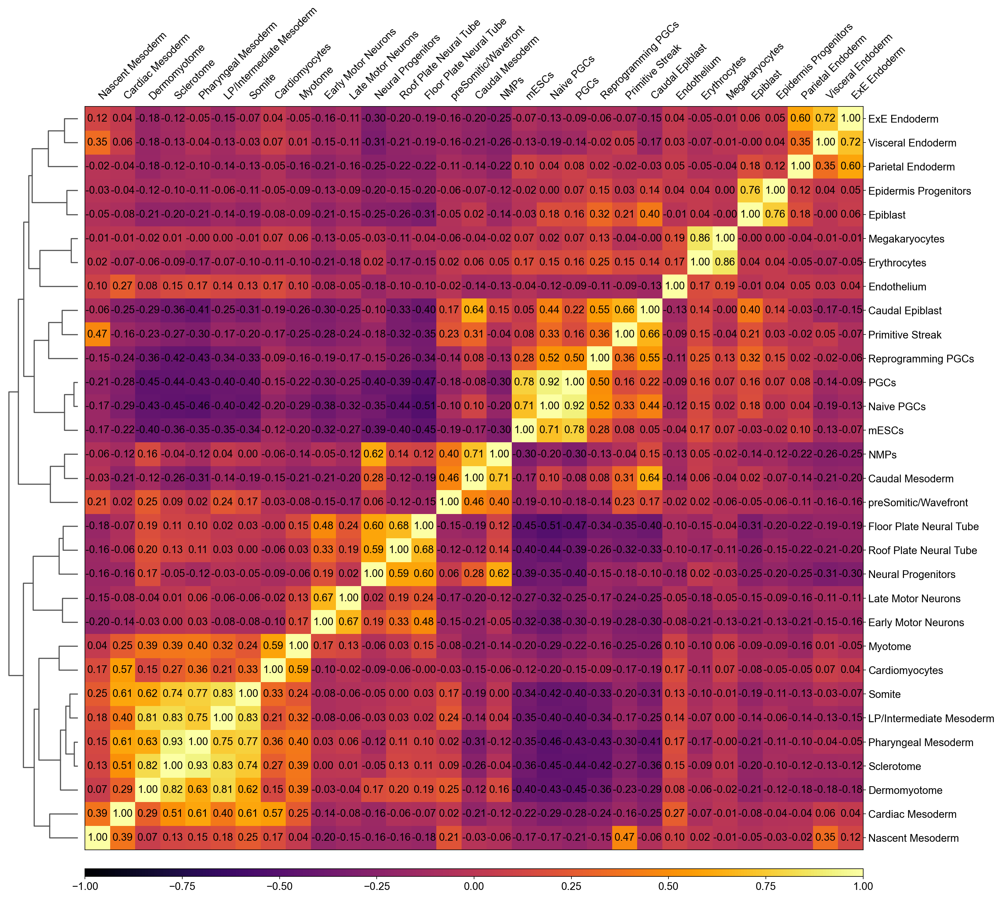

In [58]:
sc.tl.dendrogram(adata,groupby='celltype')
ax = sc.pl.correlation_matrix(adata, 'celltype', cmap='inferno',show_correlation_numbers=True,  dendrogram=True)


In [ ]:
pseudo = pd.read_csv('pseudotime/20230625_pseudotime.csv',sep=',',index_col=0)
adata.obs[['pseudotime','pseudotime2']] = pseudo[['pseudotime','pseudotime2']]

In [ ]:
adata.write('data/20230704_adata_all.h5ad')